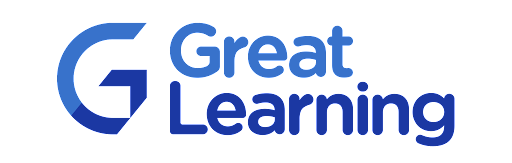

### Agenda
- Exploratory Data Analysis and Data Preprocessing.
- Machine Learning; Model Building and Evaluation.

### EDA
- Exploratory data analysis is an approach of analyzing data sets to summarize their main characteristics, often using statistical graphics and other data visualization methods.
- It is a good practice to understand the data first and try to gather as many insights from it. EDA is all about making sense of data

### Data Preprocessing
-  Data Preprocessing focuses on processing the data and making it suitable for the model.

- Before building any machine learning model it is crucial to perform data preprocessing to feed the correct data to the model to learn and predict. Model performance depends on the quality of data feeded to the model to train.

- It involves various steps like
  - Handling duplicates
  - Handling missing values
  - Handling outliers
  - Handling garbage data, incorrect or invalid data
  - Changing data types
  - Converting features into numerical data type
  - Standardizing and normalising the data
  - Making transformations of variables as needed - log tranformation, power transformation etc

- These are some of the common steps. But most of these data preprocessing steps depend on case to case basis.

### Domain: Marketing

### Problem Statement
You're a marketing analyst and you've been told by the Senior Marketing Manager that recent
marketing campaigns have not been as effective as they were expected to be. You need to analyze
the data set in order to understand this problem and propose data-driven solutions. You are required
to solve the following questions to generate a report for your management.

### Machine Learning Objective
- The main objective is to train a predictive model which allows the company to maximize the profit of the next marketing campaign.
- A response model can provide a significant boost to the efficiency of a marketing campaign by increasing responses or reducing expenses. The objective is to predict who will respond to an offer for a product or service.

### Data Description.
- ID: Customer's unique identifier
- Year_Birth: Customer's birth year
- Education: Customer's education level
- Marital_Status: Customer's marital status
- Income: Customer's yearly household income
- Kidhome: Number of children in customer's household
- Teenhome: Number of teenagers in customer's household
- Dt_Customer: Date of customer's enrollment with the company
- Recency: Number of days since customer's last purchase
- MntWines: Amount spent on wine in the last 2 years
- MntFruits: Amount spent on fruits in the last 2 years
- MntMeatProducts: Amount spent on meat in the last 2 years
- MntFishProducts: Amount spent on fish in the last 2 years
- MntSweetProducts: Amount spent on sweets in the last 2 years
- MntGoldProds: Amount spent on gold in the last 2 years
- NumDealsPurchases: Number of purchases made with a discount
- NumWebPurchases: Number of purchases made through the company's web site
- NumCatalogPurchases: Number of purchases made using a catalogue
- NumStorePurchases: Number of purchases made directly in stores
- NumWebVisitsMonth: Number of visits to company's web site in the last month
- AcceptedCmp3: 1 if customer accepted the offer in the 3rd campaign, 0 otherwise
- AcceptedCmp4: 1 if customer accepted the offer in the 4th campaign, 0 otherwise
- AcceptedCmp5: 1 if customer accepted the offer in the 5th campaign, 0 otherwise
- AcceptedCmp1: 1 if customer accepted the offer in the 1st campaign, 0 otherwise
- AcceptedCmp2: 1 if customer accepted the offer in the 2nd campaign, 0 otherwise
- Response: 1 if customer accepted the offer in the last campaign, 0 otherwise
- Complain: 1 if customer complained in the last 2 years, 0 otherwise
- Country: Customer's location

### 1. Import necessary packages

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,confusion_matrix
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)

### 2. Load the dataset and display 5 samples

In [2]:
df=pd.read_csv('marketing_data.csv')

In [5]:
df.sample(n=5)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain,Country
766,2724,1981,Master,Single,"$36,143.00",1,0,3/30/14,33,12,0,1,0,0,6,1,0,1,2,3,0,0,0,0,0,0,0,SP
813,590,1970,Master,Divorced,"$78,579.00",0,0,12/22/12,35,816,66,549,216,66,99,1,5,6,4,3,0,0,0,0,0,1,0,SP
1401,833,1955,Master,Married,"$38,452.00",1,1,3/30/14,62,56,0,14,0,0,2,3,3,0,3,7,0,0,0,0,0,0,0,SP
1501,7409,1970,Graduation,Together,"$53,187.00",1,0,10/26/13,66,211,2,30,7,7,10,2,4,1,6,5,0,0,0,0,0,0,0,SP
1283,9964,1979,Graduation,Single,"$61,825.00",0,1,8/7/13,56,162,50,100,55,30,27,1,4,2,8,4,0,0,0,0,0,0,0,SP


## EDA & Data Preprocessing

### 3. Check the info of the data and write your findings

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 28 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   ID                   2240 non-null   int64 
 1   Year_Birth           2240 non-null   int64 
 2   Education            2240 non-null   object
 3   Marital_Status       2240 non-null   object
 4    Income              2216 non-null   object
 5   Kidhome              2240 non-null   int64 
 6   Teenhome             2240 non-null   int64 
 7   Dt_Customer          2240 non-null   object
 8   Recency              2240 non-null   int64 
 9   MntWines             2240 non-null   int64 
 10  MntFruits            2240 non-null   int64 
 11  MntMeatProducts      2240 non-null   int64 
 12  MntFishProducts      2240 non-null   int64 
 13  MntSweetProducts     2240 non-null   int64 
 14  MntGoldProds         2240 non-null   int64 
 15  NumDealsPurchases    2240 non-null   int64 
 16  NumWeb

- There are no null values in any attributes of the dataset
- There are 2240 records , 28 attributes
- 5 attributes are object datatype and rest 23 are int64 datatype 

### 4. Check the following.
- Check how spread out or varied your data set is.
- Check where the middle 50% of your data lies.
- Check boundaries for the lowest, middle and upper quarters of data.



In [15]:
# Get 5 number summary for each of the numerical column

In [14]:
df.describe(exclude='O').T

,count,mean,std,min,25%,50%,75%,max
ID,2240.0,5592.159821,3246.662198,0.0,2828.25,5458.5,8427.75,11191.0
Year_Birth,2240.0,1968.805804,11.984069,1893.0,1959.00,1970.0,1977.00,1996.0
Kidhome,2240.0,0.444196,0.538398,0.0,0.00,0.0,1.00,2.0
Teenhome,2240.0,0.506250,0.544538,0.0,0.00,0.0,1.00,2.0
Recency,2240.0,49.109375,28.962453,0.0,24.00,49.0,74.00,99.0
MntWines,2240.0,303.935714,336.597393,0.0,23.75,173.5,504.25,1493.0
MntFruits,2240.0,26.302232,39.773434,0.0,1.00,8.0,33.00,199.0
MntMeatProducts,2240.0,166.950000,225.715373,0.0,16.00,67.0,232.00,1725.0
MntFishProducts,2240.0,37.525446,54.628979,0.0,3.00,12.0,50.00,259.0
MntSweetProducts,2240.0,27.062946,41.280498,0.0,1.00,8.0,33.00,263.0


In [13]:
df.describe(exclude='O').loc[['min','25%','50%','75%','max']].T

,min,25%,50%,75%,max
ID,0.0,2828.25,5458.5,8427.75,11191.0
Year_Birth,1893.0,1959.00,1970.0,1977.00,1996.0
Kidhome,0.0,0.00,0.0,1.00,2.0
Teenhome,0.0,0.00,0.0,1.00,2.0
Recency,0.0,24.00,49.0,74.00,99.0
MntWines,0.0,23.75,173.5,504.25,1493.0
MntFruits,0.0,1.00,8.0,33.00,199.0
MntMeatProducts,0.0,16.00,67.0,232.00,1725.0
MntFishProducts,0.0,3.00,12.0,50.00,259.0
MntSweetProducts,0.0,1.00,8.0,33.00,263.0


In [18]:
df.describe(exclude='O').iloc[3:8,:].T

,min,25%,50%,75%,max
ID,0.0,2828.25,5458.5,8427.75,11191.0
Year_Birth,1893.0,1959.00,1970.0,1977.00,1996.0
Kidhome,0.0,0.00,0.0,1.00,2.0
Teenhome,0.0,0.00,0.0,1.00,2.0
Recency,0.0,24.00,49.0,74.00,99.0
MntWines,0.0,23.75,173.5,504.25,1493.0
MntFruits,0.0,1.00,8.0,33.00,199.0
MntMeatProducts,0.0,16.00,67.0,232.00,1725.0
MntFishProducts,0.0,3.00,12.0,50.00,259.0
MntSweetProducts,0.0,1.00,8.0,33.00,263.0


In [9]:
df.describe(include='O').T

,count,unique,top,freq
Education,2240,5,Graduation,1127
Marital_Status,2240,8,Married,864
Income,2216,1974,"$7,500.00",12
Dt_Customer,2240,663,8/31/12,12
Country,2240,8,SP,1095


### 5. Check for any missing values in the dataset and How will you handle them?

In [19]:
df.isnull().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
 Income                24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Response                0
Complain                0
Country                 0
dtype: int64

- 'Income' has null values. Let's check the distribution and outliers, if any!

In [22]:
df.columns 

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', ' Income ',
       'Kidhome', 'Teenhome', 'Dt_Customer', 'Recency', 'MntWines',
       'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Response', 'Complain', 'Country'],
      dtype='object')

In [103]:
my_df.rename(columns={' Income ':'Income'},inplace=True)

In [104]:
my_df.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Response', 'Complain', 'Country'],
      dtype='object')

In [105]:
my_df.Income.unique()

array(['$84,835.00 ', '$57,091.00 ', '$67,267.00 ', ..., '$46,310.00 ',
       '$65,819.00 ', '$94,871.00 '], dtype=object)

In [106]:
def remove_dollar(x):
    if type(x)==str:
        x=x.replace('$','')
        return x
    else:
        return x

In [107]:
my_df.Income=my_df.Income.apply(remove_dollar)

In [108]:
my_df.Income.unique()

array(['84,835.00 ', '57,091.00 ', '67,267.00 ', ..., '46,310.00 ',
       '65,819.00 ', '94,871.00 '], dtype=object)

In [109]:
def remove_comma(x):
    if type(x)==str:
        x=x.replace(',','')
        return x
    else:
        return x

In [110]:
my_df.Income=my_df.Income.apply(remove_comma)

In [111]:
my_df.Income.unique()

array(['84835.00 ', '57091.00 ', '67267.00 ', ..., '46310.00 ',
       '65819.00 ', '94871.00 '], dtype=object)

In [112]:
my_df.Income=my_df.Income.astype('float64')

In [113]:
my_df.Income.unique()

array([84835., 57091., 67267., ..., 46310., 65819., 94871.])

In [114]:
my_df.Income.info()

<class 'pandas.core.series.Series'>
RangeIndex: 2240 entries, 0 to 2239
Series name: Income
Non-Null Count  Dtype  
--------------  -----  
2216 non-null   float64
dtypes: float64(1)
memory usage: 17.6 KB


In [40]:
df.Income.describe()

count      2216.000000
mean      52247.251354
std       25173.076661
min        1730.000000
25%       35303.000000
50%       51381.500000
75%       68522.000000
max      666666.000000
Name: Income, dtype: float64

<AxesSubplot:xlabel='Income', ylabel='Count'>

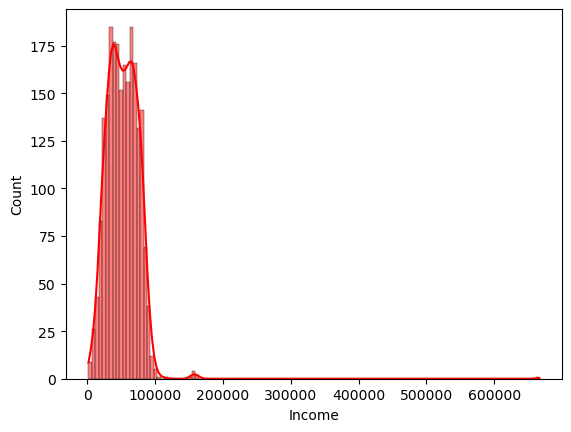

In [116]:
sns.histplot(data=my_df.Income,kde=True,color='red')

<AxesSubplot:ylabel='Density'>

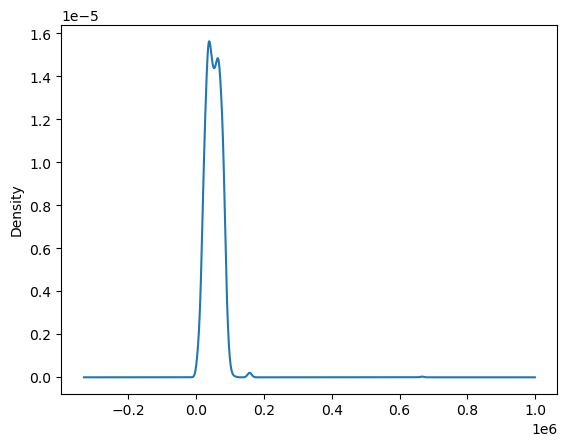

In [115]:
my_df.Income.plot(kind='kde')

In [117]:
mean=round(my_df.Income.mean(),1)
mean

52247.3

In [118]:
# Since the distribution of Income values are approximately normal, so we convert the null values with their mean
my_df['Income'].fillna(value=my_df['Income'].mean(),inplace=True)

In [119]:
my_df['Income'].isnull().sum()

0

In [120]:
my_df.isnull().sum()

ID                     0
Year_Birth             0
Education              0
Marital_Status         0
Income                 0
Kidhome                0
Teenhome               0
Dt_Customer            0
Recency                0
MntWines               0
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds           0
NumDealsPurchases      0
NumWebPurchases        0
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
AcceptedCmp3           0
AcceptedCmp4           0
AcceptedCmp5           0
AcceptedCmp1           0
AcceptedCmp2           0
Response               0
Complain               0
Country                0
dtype: int64

### 6. Check for any presence of Special characters in any variables. If present clean/replace and change the datatype of the variable if required.

In [121]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [122]:
my_df.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Response', 'Complain', 'Country'],
      dtype='object')

In [123]:
my_df['Education'].unique()

array(['Graduation', 'PhD', '2n Cycle', 'Master', 'Basic'], dtype=object)

- '2n Cycle' inside 'Education' column
- 'Income' column had special characters '$' and  ','
-  Have replaced them earlier and changed the datatype to Float

### 7. Marketing Manager wants to know the 'Age'  of the customers. How will u extract the feature age from the given dataset?

In [98]:
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Dt_Customer,Country,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain
0,1826,1970,Graduation,Divorced,84835.0,6/16/14,SP,0,0,0,189,104,379,111,189,218,1,4,4,6,1,0,0,0,0,0,1,0
1,1,1961,Graduation,Single,57091.0,6/15/14,CA,0,0,0,464,5,64,7,0,37,1,7,3,7,5,0,0,0,0,1,1,0
2,10476,1958,Graduation,Married,67267.0,5/13/14,US,0,1,0,134,11,59,15,2,30,1,3,2,5,2,0,0,0,0,0,0,0
3,1386,1967,Graduation,Together,32474.0,5/11/14,AUS,1,1,0,10,0,1,0,0,0,1,1,0,2,7,0,0,0,0,0,0,0
4,5371,1989,Graduation,Single,21474.0,4/8/14,SP,1,0,0,6,16,24,11,0,34,2,3,1,2,7,1,0,0,0,0,1,0


In [124]:
my_df['Customer Age']=2023-my_df['Year_Birth']

In [125]:
my_df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain,Country,Customer Age
0,1826,1970,Graduation,Divorced,84835.0,0,0,6/16/14,0,189,104,379,111,189,218,1,4,4,6,1,0,0,0,0,0,1,0,SP,53
1,1,1961,Graduation,Single,57091.0,0,0,6/15/14,0,464,5,64,7,0,37,1,7,3,7,5,0,0,0,0,1,1,0,CA,62
2,10476,1958,Graduation,Married,67267.0,0,1,5/13/14,0,134,11,59,15,2,30,1,3,2,5,2,0,0,0,0,0,0,0,US,65
3,1386,1967,Graduation,Together,32474.0,1,1,5/11/14,0,10,0,1,0,0,0,1,1,0,2,7,0,0,0,0,0,0,0,AUS,56
4,5371,1989,Graduation,Single,21474.0,1,0,4/8/14,0,6,16,24,11,0,34,2,3,1,2,7,1,0,0,0,0,1,0,SP,34


### 8. Marketing manager wants to understand the total amount spent on various products so that we can find what percentage of amount is spent on which product. (for each customer)

In [127]:
res_5=my_df.groupby(by=['ID'])['MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds'].sum()
res_5

,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds
ID,,,,,,
0,239,10,554,254,87,54
1,464,5,64,7,0,37
9,57,0,27,0,0,36
13,19,0,5,0,0,8
17,637,47,237,12,19,76
20,43,12,23,29,15,61
22,185,2,88,15,5,14
24,18,2,19,0,2,6
25,460,35,422,33,12,153


In [126]:
# Create a pie-chart 


### 9. Being an Analyst understand the total number of purchases made through different channels which can help find the percentage these channels contribute.

In [128]:
channel_purchases=my_df[['NumDealsPurchases','NumStorePurchases','NumCatalogPurchases','NumWebPurchases']].sum().sort_values(ascending=False)
channel_purchases

NumStorePurchases      12970
NumWebPurchases         9150
NumCatalogPurchases     5963
NumDealsPurchases       5208
dtype: int64

In [129]:
channel_purchases.values

array([12970,  9150,  5963,  5208], dtype=int64)

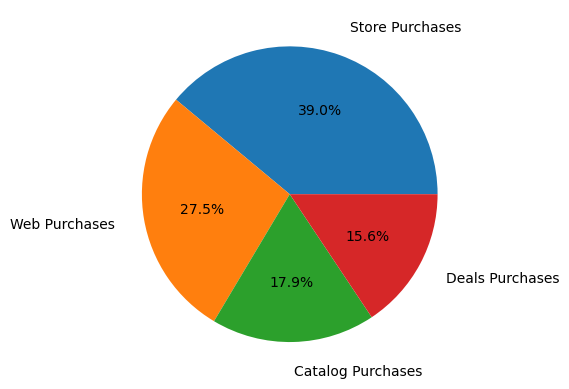

In [130]:
plt.pie(
channel_purchases.values,autopct='%1.1f%%',
labels=['Store Purchases','Web Purchases','Catalog Purchases','Deals Purchases'],
labeldistance=1.2,    
shadow=False)
plt.show()

### 10. Find which marketing campaign is most successful? use suitable graphs for visualization

In [131]:
my_df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain,Country,Customer Age
0,1826,1970,Graduation,Divorced,84835.0,0,0,6/16/14,0,189,104,379,111,189,218,1,4,4,6,1,0,0,0,0,0,1,0,SP,53
1,1,1961,Graduation,Single,57091.0,0,0,6/15/14,0,464,5,64,7,0,37,1,7,3,7,5,0,0,0,0,1,1,0,CA,62
2,10476,1958,Graduation,Married,67267.0,0,1,5/13/14,0,134,11,59,15,2,30,1,3,2,5,2,0,0,0,0,0,0,0,US,65
3,1386,1967,Graduation,Together,32474.0,1,1,5/11/14,0,10,0,1,0,0,0,1,1,0,2,7,0,0,0,0,0,0,0,AUS,56
4,5371,1989,Graduation,Single,21474.0,1,0,4/8/14,0,6,16,24,11,0,34,2,3,1,2,7,1,0,0,0,0,1,0,SP,34


In [134]:
my_df.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Response', 'Complain', 'Country', 'Customer Age'],
      dtype='object')

In [135]:
campaign=my_df[['AcceptedCmp3','AcceptedCmp4','AcceptedCmp5','AcceptedCmp1','AcceptedCmp2']].apply(pd.Series.value_counts)
campaign

,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2
0,2077,2073,2077,2096,2210
1,163,167,163,144,30


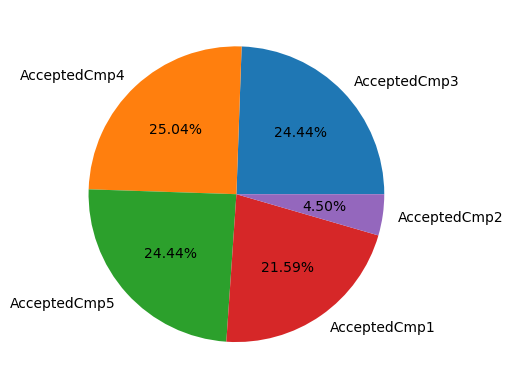

In [137]:
plt.pie(campaign.iloc[1,:],autopct='%1.2f%%',labels=['AcceptedCmp3','AcceptedCmp4','AcceptedCmp5','AcceptedCmp1','AcceptedCmp2'])
plt.show()

- Campaign 4 was the most successful campaign with Acceptance of 167 people

### 11. Plot a Graph and analyze which products are performing the best and which are performing the least in terms of revenue generated?

In [138]:
my_df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain,Country,Customer Age
0,1826,1970,Graduation,Divorced,84835.0,0,0,6/16/14,0,189,104,379,111,189,218,1,4,4,6,1,0,0,0,0,0,1,0,SP,53
1,1,1961,Graduation,Single,57091.0,0,0,6/15/14,0,464,5,64,7,0,37,1,7,3,7,5,0,0,0,0,1,1,0,CA,62
2,10476,1958,Graduation,Married,67267.0,0,1,5/13/14,0,134,11,59,15,2,30,1,3,2,5,2,0,0,0,0,0,0,0,US,65
3,1386,1967,Graduation,Together,32474.0,1,1,5/11/14,0,10,0,1,0,0,0,1,1,0,2,7,0,0,0,0,0,0,0,AUS,56
4,5371,1989,Graduation,Single,21474.0,1,0,4/8/14,0,6,16,24,11,0,34,2,3,1,2,7,1,0,0,0,0,1,0,SP,34


In [262]:
df.columns

Index(['ID', 'Year_Birth', 'Age', 'Education', 'Marital_Status', 'Income',
       'Dt_Customer', 'Country', 'Kidhome', 'Teenhome', 'Recency', 'MntWines',
       'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'Cmpn-3', 'Cmpn-4', 'Cmpn-5', 'Cmpn-1', 'Cmpn-2', 'Response',
       'Complain'],
      dtype='object')

In [139]:
res_1=my_df[['MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds']].sum().sort_values(ascending=False)

In [140]:
res_1

MntWines            680816
MntMeatProducts     373968
MntGoldProds         98609
MntFishProducts      84057
MntSweetProducts     60621
MntFruits            58917
dtype: int64

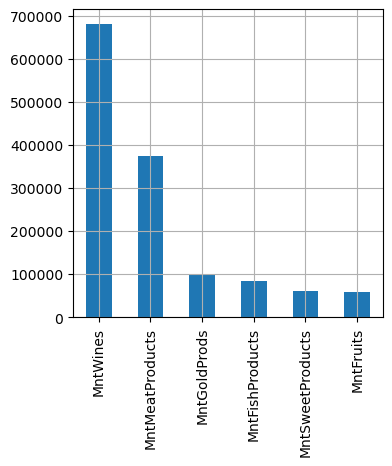

In [141]:
plt.figure(figsize=(4,4))
res_1.plot(kind='bar')
plt.grid(True)

- Wines performed the best with total spend amount>650000
- Fruits performed the least with total spend amount<60000

### 12. Plot a suitable graph to visualize the distribution of the feature age with respect to customers who accepted the last  Campaign.

In [142]:
my_df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain,Country,Customer Age
0,1826,1970,Graduation,Divorced,84835.0,0,0,6/16/14,0,189,104,379,111,189,218,1,4,4,6,1,0,0,0,0,0,1,0,SP,53
1,1,1961,Graduation,Single,57091.0,0,0,6/15/14,0,464,5,64,7,0,37,1,7,3,7,5,0,0,0,0,1,1,0,CA,62
2,10476,1958,Graduation,Married,67267.0,0,1,5/13/14,0,134,11,59,15,2,30,1,3,2,5,2,0,0,0,0,0,0,0,US,65
3,1386,1967,Graduation,Together,32474.0,1,1,5/11/14,0,10,0,1,0,0,0,1,1,0,2,7,0,0,0,0,0,0,0,AUS,56
4,5371,1989,Graduation,Single,21474.0,1,0,4/8/14,0,6,16,24,11,0,34,2,3,1,2,7,1,0,0,0,0,1,0,SP,34


In [151]:
d3=my_df[my_df['Response']==1]
d3.head()

,ID,Year_Birth,Customer Age,Country,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain
0,1826,1970,53,SP,Graduation,Divorced,84835.0,0,0,6/16/14,0,189,104,379,111,189,218,1,4,4,6,1,0,0,0,0,0,1,0
1,1,1961,62,CA,Graduation,Single,57091.0,0,0,6/15/14,0,464,5,64,7,0,37,1,7,3,7,5,0,0,0,0,1,1,0
4,5371,1989,34,SP,Graduation,Single,21474.0,1,0,4/8/14,0,6,16,24,11,0,34,2,3,1,2,7,1,0,0,0,0,1,0
5,7348,1958,65,SP,PhD,Single,71691.0,0,0,3/17/14,0,336,130,411,240,32,43,1,4,7,5,2,0,0,0,0,0,1,0
6,4073,1954,69,GER,2n Cycle,Married,63564.0,0,0,1/29/14,0,769,80,252,15,34,65,1,10,10,7,6,1,0,0,0,0,1,0


<AxesSubplot:xlabel='Customer Age', ylabel='Count'>

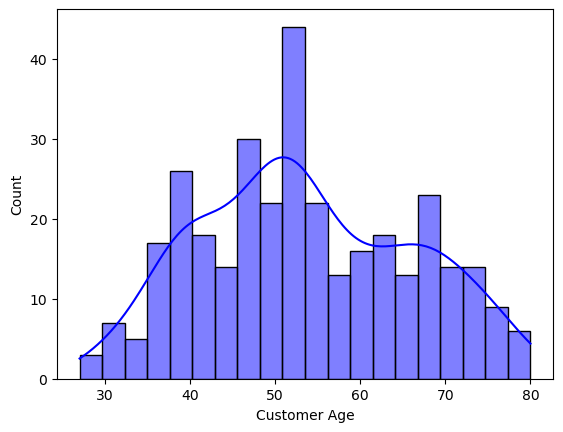

In [152]:
sns.histplot(data=d3['Customer Age'],kde=True,bins=20,color='blue')

###  13. The Chief Marketing specialist wants to visually see that Which Country has the most number of customers who accepted the last campaign. What is your approach?

In [153]:
d3.head()

,ID,Year_Birth,Customer Age,Country,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain
0,1826,1970,53,SP,Graduation,Divorced,84835.0,0,0,6/16/14,0,189,104,379,111,189,218,1,4,4,6,1,0,0,0,0,0,1,0
1,1,1961,62,CA,Graduation,Single,57091.0,0,0,6/15/14,0,464,5,64,7,0,37,1,7,3,7,5,0,0,0,0,1,1,0
4,5371,1989,34,SP,Graduation,Single,21474.0,1,0,4/8/14,0,6,16,24,11,0,34,2,3,1,2,7,1,0,0,0,0,1,0
5,7348,1958,65,SP,PhD,Single,71691.0,0,0,3/17/14,0,336,130,411,240,32,43,1,4,7,5,2,0,0,0,0,0,1,0
6,4073,1954,69,GER,2n Cycle,Married,63564.0,0,0,1/29/14,0,769,80,252,15,34,65,1,10,10,7,6,1,0,0,0,0,1,0


In [148]:
my_df.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Response', 'Complain', 'Country', 'Customer Age'],
      dtype='object')

In [149]:
my_df=my_df.reindex(columns=['ID', 'Year_Birth','Customer Age','Country','Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Response', 'Complain'])

In [150]:
my_df.head()

,ID,Year_Birth,Customer Age,Country,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain
0,1826,1970,53,SP,Graduation,Divorced,84835.0,0,0,6/16/14,0,189,104,379,111,189,218,1,4,4,6,1,0,0,0,0,0,1,0
1,1,1961,62,CA,Graduation,Single,57091.0,0,0,6/15/14,0,464,5,64,7,0,37,1,7,3,7,5,0,0,0,0,1,1,0
2,10476,1958,65,US,Graduation,Married,67267.0,0,1,5/13/14,0,134,11,59,15,2,30,1,3,2,5,2,0,0,0,0,0,0,0
3,1386,1967,56,AUS,Graduation,Together,32474.0,1,1,5/11/14,0,10,0,1,0,0,0,1,1,0,2,7,0,0,0,0,0,0,0
4,5371,1989,34,SP,Graduation,Single,21474.0,1,0,4/8/14,0,6,16,24,11,0,34,2,3,1,2,7,1,0,0,0,0,1,0


<AxesSubplot:xlabel='Country'>

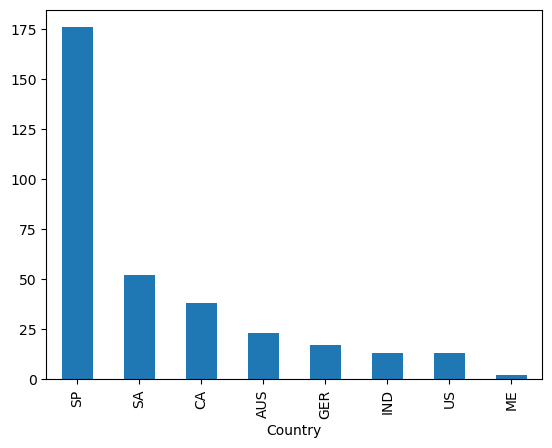

In [154]:
d3.groupby(by=['Country'])['ID'].count().sort_values(ascending=False).plot(kind='bar')

- Spain('SP') has the most number of customers accepting the last campaign

### 14. Analyse visually and write your inferences about the relationship between the following:-
- i) Total amount spent Vs Dependents.  (Dependents=['Kidhome']+['Teenhome'])
- ii) Total Purchases Vs Dependents.

In [156]:
my_df.head()

,ID,Year_Birth,Customer Age,Country,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain
0,1826,1970,53,SP,Graduation,Divorced,84835.0,0,0,6/16/14,0,189,104,379,111,189,218,1,4,4,6,1,0,0,0,0,0,1,0
1,1,1961,62,CA,Graduation,Single,57091.0,0,0,6/15/14,0,464,5,64,7,0,37,1,7,3,7,5,0,0,0,0,1,1,0
2,10476,1958,65,US,Graduation,Married,67267.0,0,1,5/13/14,0,134,11,59,15,2,30,1,3,2,5,2,0,0,0,0,0,0,0
3,1386,1967,56,AUS,Graduation,Together,32474.0,1,1,5/11/14,0,10,0,1,0,0,0,1,1,0,2,7,0,0,0,0,0,0,0
4,5371,1989,34,SP,Graduation,Single,21474.0,1,0,4/8/14,0,6,16,24,11,0,34,2,3,1,2,7,1,0,0,0,0,1,0


In [157]:
my_df['Total_amount_spent']=my_df['MntWines']+my_df['MntSweetProducts']+my_df['MntMeatProducts']+my_df['MntGoldProds']+my_df['MntFruits']+my_df['MntFishProducts']

In [158]:
my_df['Dependents']=my_df['Kidhome']+my_df['Teenhome']

In [159]:
my_df.head()

,ID,Year_Birth,Customer Age,Country,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain,Total_amount_spent,Dependents
0,1826,1970,53,SP,Graduation,Divorced,84835.0,0,0,6/16/14,0,189,104,379,111,189,218,1,4,4,6,1,0,0,0,0,0,1,0,1190,0
1,1,1961,62,CA,Graduation,Single,57091.0,0,0,6/15/14,0,464,5,64,7,0,37,1,7,3,7,5,0,0,0,0,1,1,0,577,0
2,10476,1958,65,US,Graduation,Married,67267.0,0,1,5/13/14,0,134,11,59,15,2,30,1,3,2,5,2,0,0,0,0,0,0,0,251,1
3,1386,1967,56,AUS,Graduation,Together,32474.0,1,1,5/11/14,0,10,0,1,0,0,0,1,1,0,2,7,0,0,0,0,0,0,0,11,2
4,5371,1989,34,SP,Graduation,Single,21474.0,1,0,4/8/14,0,6,16,24,11,0,34,2,3,1,2,7,1,0,0,0,0,1,0,91,1


In [161]:
my_df['Total_amount_spent'].corr(my_df['Dependents'])

-0.49888764868089897

<AxesSubplot:xlabel='Dependents', ylabel='Total amount spent'>

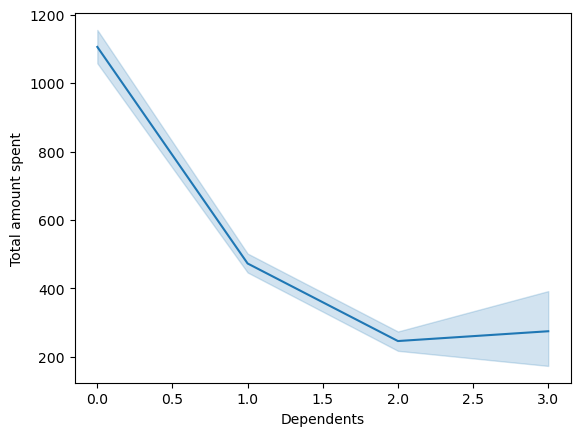

In [24]:
sns.lineplot(x='Dependents',y='Total amount spent',data=df)

In [163]:
my_df.columns

Index(['ID', 'Year_Birth', 'Customer Age', 'Country', 'Education',
       'Marital_Status', 'Income', 'Kidhome', 'Teenhome', 'Dt_Customer',
       'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts',
       'MntFishProducts', 'MntSweetProducts', 'MntGoldProds',
       'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
       'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3',
       'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2',
       'Response', 'Complain', 'Total_amount_spent', 'Dependents',
       'Total Purchases'],
      dtype='object')

In [162]:
my_df['Total Purchases']=my_df['NumWebPurchases']+my_df['NumDealsPurchases']+my_df['NumCatalogPurchases']+my_df['NumStorePurchases']+my_df['NumWebVisitsMonth']

In [164]:
my_df['Total Purchases'].corr(my_df['Dependents'])

-0.11950947750511878

<AxesSubplot:xlabel='Dependents', ylabel='Total Purchases'>

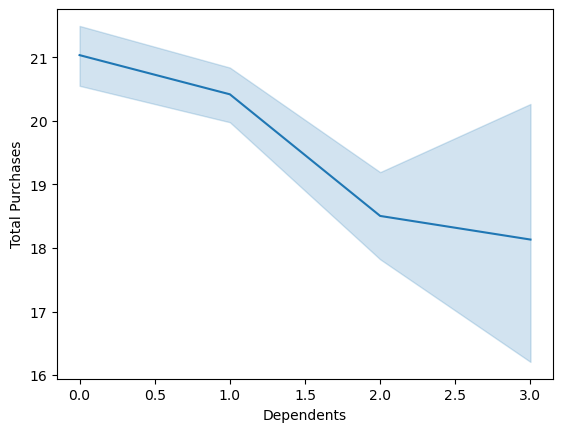

In [165]:
sns.lineplot(x='Dependents',y='Total Purchases',data=my_df)

### 15. Perform Correlation Analysis and write your key inferences.

In [167]:
my_df.head()

,ID,Year_Birth,Customer Age,Country,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain,Total_amount_spent,Dependents,Total Purchases
0,1826,1970,53,SP,Graduation,Divorced,84835.0,0,0,6/16/14,0,189,104,379,111,189,218,1,4,4,6,1,0,0,0,0,0,1,0,1190,0,16
1,1,1961,62,CA,Graduation,Single,57091.0,0,0,6/15/14,0,464,5,64,7,0,37,1,7,3,7,5,0,0,0,0,1,1,0,577,0,23
2,10476,1958,65,US,Graduation,Married,67267.0,0,1,5/13/14,0,134,11,59,15,2,30,1,3,2,5,2,0,0,0,0,0,0,0,251,1,13
3,1386,1967,56,AUS,Graduation,Together,32474.0,1,1,5/11/14,0,10,0,1,0,0,0,1,1,0,2,7,0,0,0,0,0,0,0,11,2,11
4,5371,1989,34,SP,Graduation,Single,21474.0,1,0,4/8/14,0,6,16,24,11,0,34,2,3,1,2,7,1,0,0,0,0,1,0,91,1,15


In [169]:
new_df=my_df.drop(columns=['ID'],axis=1)

<AxesSubplot:>

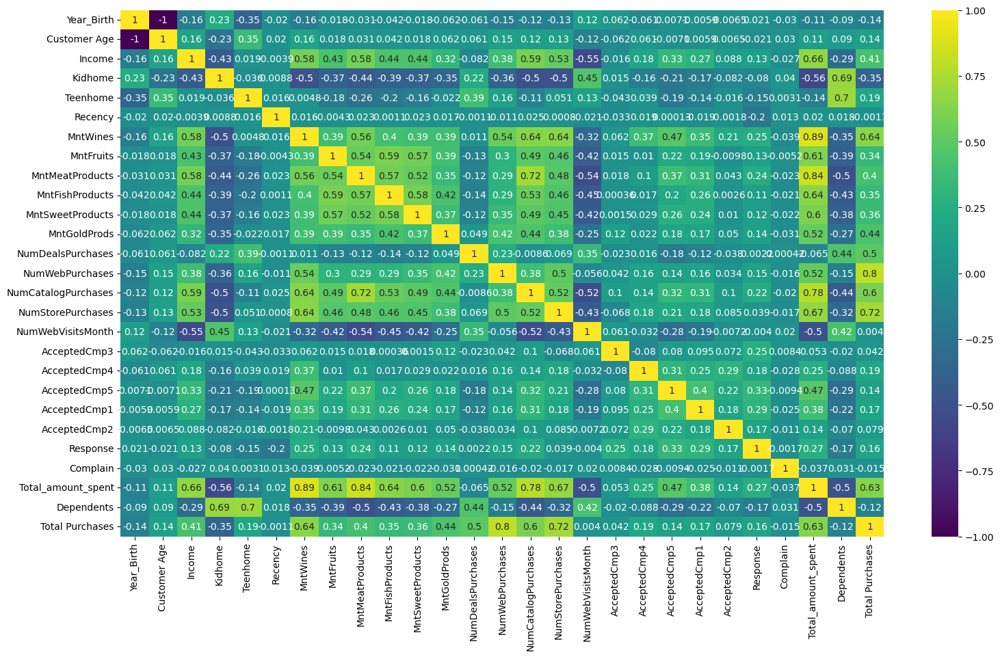

In [183]:
plt.figure(figsize=(18,10))
sns.heatmap(data=new_df.corr(),annot=True, cmap='viridis')

### 16. Find and Understand the Education background of the customers who complained in the last 2 years.
- State the Education background of the customers who have registered the most complaints.

In [174]:
my_df.head()

,ID,Year_Birth,Customer Age,Country,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain,Total_amount_spent,Dependents,Total Purchases
0,1826,1970,53,SP,Graduation,Divorced,84835.0,0,0,6/16/14,0,189,104,379,111,189,218,1,4,4,6,1,0,0,0,0,0,1,0,1190,0,16
1,1,1961,62,CA,Graduation,Single,57091.0,0,0,6/15/14,0,464,5,64,7,0,37,1,7,3,7,5,0,0,0,0,1,1,0,577,0,23
2,10476,1958,65,US,Graduation,Married,67267.0,0,1,5/13/14,0,134,11,59,15,2,30,1,3,2,5,2,0,0,0,0,0,0,0,251,1,13
3,1386,1967,56,AUS,Graduation,Together,32474.0,1,1,5/11/14,0,10,0,1,0,0,0,1,1,0,2,7,0,0,0,0,0,0,0,11,2,11
4,5371,1989,34,SP,Graduation,Single,21474.0,1,0,4/8/14,0,6,16,24,11,0,34,2,3,1,2,7,1,0,0,0,0,1,0,91,1,15


In [175]:
complained=my_df[my_df['Complain']==1]

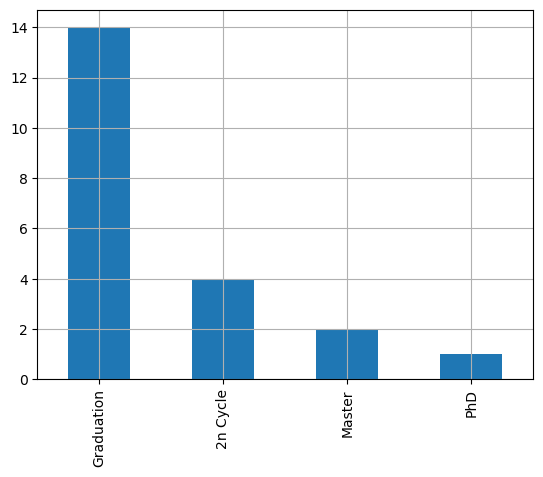

In [176]:
complained['Education'].value_counts().plot(kind='bar')
plt.grid(True)

- People who have graduated have complained the most in last 2 years

### 17. Use features 'Total_amount_spent', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts' and, 'MntGoldProds'.
- i) Plot a pairplot with hue as Response.
- ii) Plot a pairplot with hue as Education.
- iii) Plot a pairplot with hue as Marital Status and write your key observations.

In [185]:
d4=my_df[['Total_amount_spent','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds','Response','Education','Marital_Status']]
d4.head()

,Total_amount_spent,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,Response,Education,Marital_Status
0,1190,104,379,111,189,218,1,Graduation,Divorced
1,577,5,64,7,0,37,1,Graduation,Single
2,251,11,59,15,2,30,0,Graduation,Married
3,11,0,1,0,0,0,0,Graduation,Together
4,91,16,24,11,0,34,1,Graduation,Single


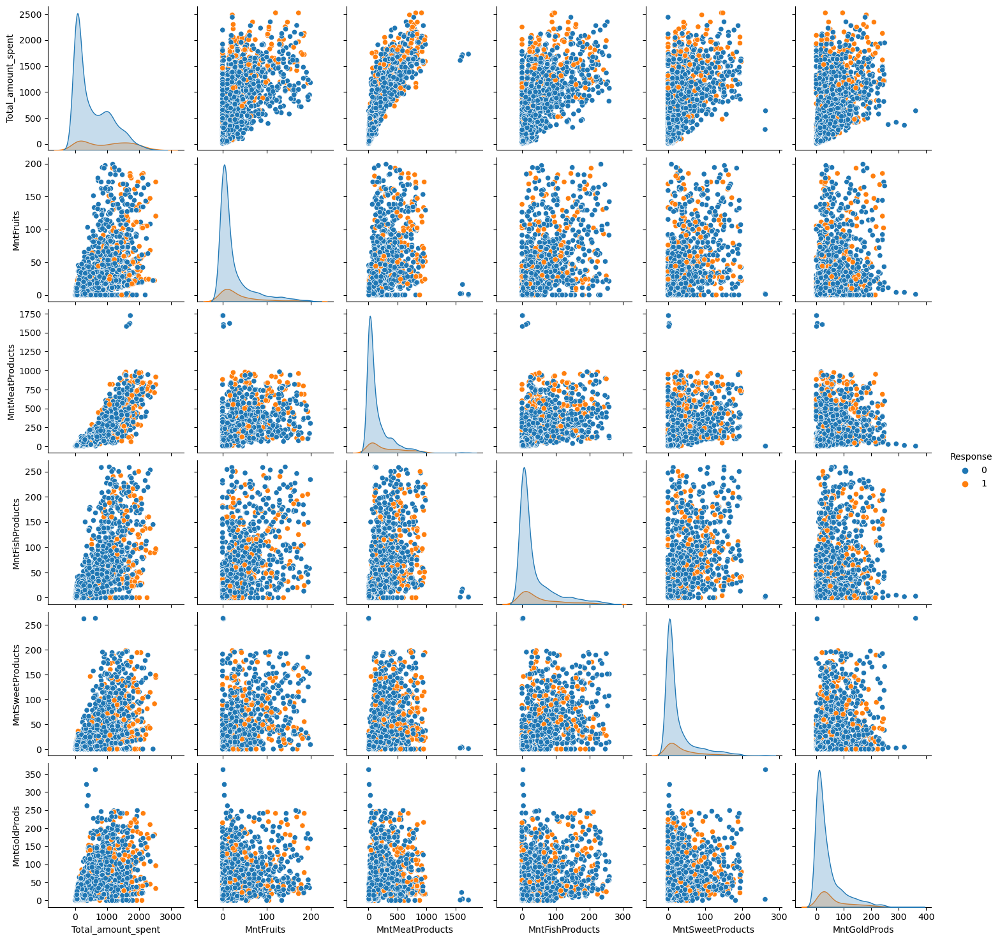

In [186]:
sns.pairplot(data=d4,hue='Response')

- Total Amount Spent increases with increase in customers not accepting the campaign

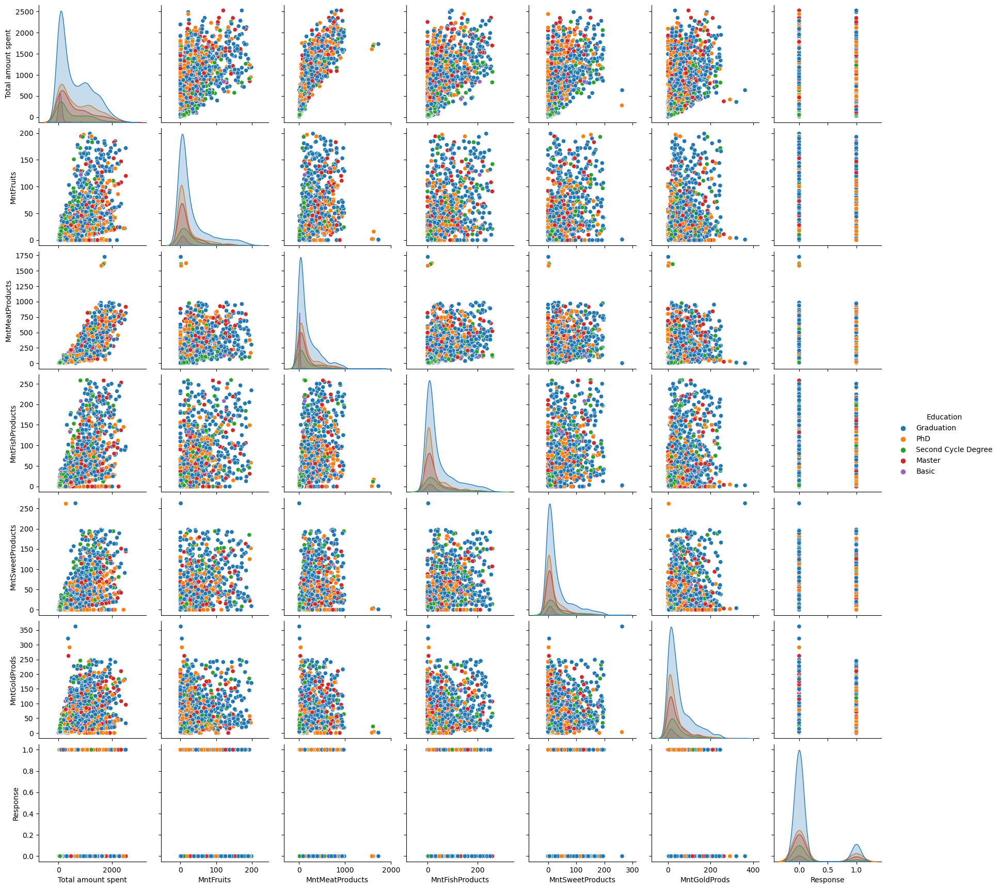

In [71]:
sns.pairplot(data=d4,hue='Education')

- Total Amount spent increases for Graduating students

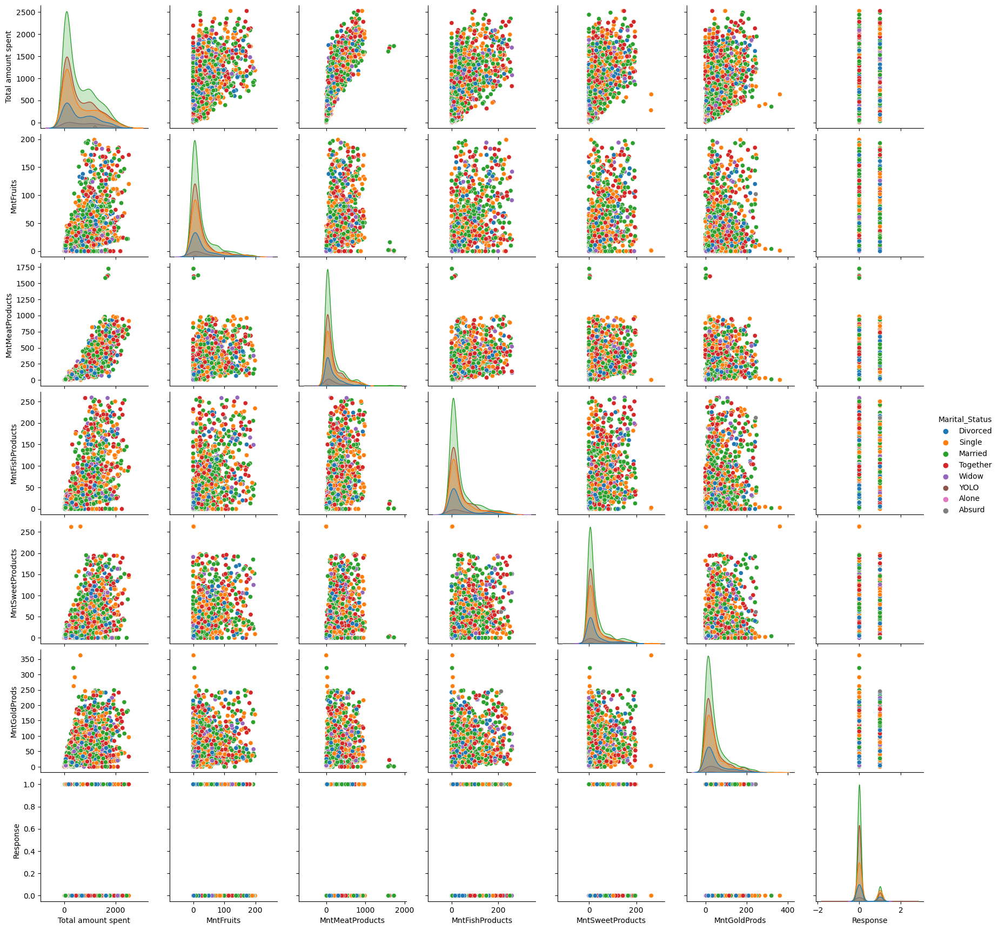

In [72]:
sns.pairplot(data=d4,hue='Marital_Status')

## Machine Learning: Model Building and Evaluation.

### 18. Create a copy of the dataset and drop the redundant columns from the dataset.

In [189]:
my_df.head()

,ID,Year_Birth,Customer Age,Country,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain,Total_amount_spent,Dependents,Total Purchases
0,1826,1970,53,SP,Graduation,Divorced,84835.0,0,0,6/16/14,0,189,104,379,111,189,218,1,4,4,6,1,0,0,0,0,0,1,0,1190,0,16
1,1,1961,62,CA,Graduation,Single,57091.0,0,0,6/15/14,0,464,5,64,7,0,37,1,7,3,7,5,0,0,0,0,1,1,0,577,0,23
2,10476,1958,65,US,Graduation,Married,67267.0,0,1,5/13/14,0,134,11,59,15,2,30,1,3,2,5,2,0,0,0,0,0,0,0,251,1,13
3,1386,1967,56,AUS,Graduation,Together,32474.0,1,1,5/11/14,0,10,0,1,0,0,0,1,1,0,2,7,0,0,0,0,0,0,0,11,2,11
4,5371,1989,34,SP,Graduation,Single,21474.0,1,0,4/8/14,0,6,16,24,11,0,34,2,3,1,2,7,1,0,0,0,0,1,0,91,1,15


In [190]:
my_df_copy=my_df.copy()

In [200]:
my_df_copy.head()

,Age,Country,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain,Total_amount_spent,Dependents,Total Purchases
0,53,SP,Graduation,Divorced,84835.0,0,0,0,189,104,379,111,189,218,1,4,4,6,1,0,0,0,0,0,1,0,1190,0,16
1,62,CA,Graduation,Single,57091.0,0,0,0,464,5,64,7,0,37,1,7,3,7,5,0,0,0,0,1,1,0,577,0,23
2,65,US,Graduation,Married,67267.0,0,1,0,134,11,59,15,2,30,1,3,2,5,2,0,0,0,0,0,0,0,251,1,13
3,56,AUS,Graduation,Together,32474.0,1,1,0,10,0,1,0,0,0,1,1,0,2,7,0,0,0,0,0,0,0,11,2,11
4,34,SP,Graduation,Single,21474.0,1,0,0,6,16,24,11,0,34,2,3,1,2,7,1,0,0,0,0,1,0,91,1,15


In [192]:
my_df_copy.drop(columns=['ID','Year_Birth','Dt_Customer'],axis=1,inplace=True)

In [195]:
my_df_copy=my_df_copy.rename(columns={'Customer Age':'Age'})

### 19. Encode the categorical columns.

In [197]:
from sklearn.preprocessing import LabelEncoder
labelencoder=LabelEncoder()

In [198]:
labelencoder

LabelEncoder()

In [201]:
my_df_copy['Education']=labelencoder.fit_transform(my_df_copy['Education'])

In [202]:
my_df_copy['Marital_Status']=labelencoder.fit_transform(my_df_copy['Marital_Status'])

In [204]:
my_df_copy.rename(columns={'Total Purchases':'Total_Purchases'},inplace=True)

In [210]:
my_df_copy.head()

,Age,Country,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Response,Complain,Total_amount_spent,Dependents,Total_Purchases
0,53,SP,2,2,84835.0,0,0,0,189,104,379,111,189,218,1,4,4,6,1,0,0,0,0,0,1,0,1190,0,16
1,62,CA,2,4,57091.0,0,0,0,464,5,64,7,0,37,1,7,3,7,5,0,0,0,0,1,1,0,577,0,23
2,65,US,2,3,67267.0,0,1,0,134,11,59,15,2,30,1,3,2,5,2,0,0,0,0,0,0,0,251,1,13
3,56,AUS,2,5,32474.0,1,1,0,10,0,1,0,0,0,1,1,0,2,7,0,0,0,0,0,0,0,11,2,11
4,34,SP,2,4,21474.0,1,0,0,6,16,24,11,0,34,2,3,1,2,7,1,0,0,0,0,1,0,91,1,15


In [208]:
my_df['Marital_Status'].unique()

array(['Divorced', 'Single', 'Married', 'Together', 'Widow', 'YOLO',
       'Alone', 'Absurd'], dtype=object)

In [209]:
my_df_copy['Marital_Status'].unique()

array([2, 4, 3, 5, 6, 7, 1, 0])

### 20. Segregate the dependent and independent features and store them in the variables X and Y

In [216]:
Y=my_df_copy['Response'].to_frame()
Y.head()

,Response
0,1
1,1
2,0
3,0
4,1


In [213]:
X=my_df_copy.drop(columns=['Response'],axis=1)

In [215]:
X.head()

,Age,Country,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Total_amount_spent,Dependents,Total_Purchases
0,53,SP,2,2,84835.0,0,0,0,189,104,379,111,189,218,1,4,4,6,1,0,0,0,0,0,0,1190,0,16
1,62,CA,2,4,57091.0,0,0,0,464,5,64,7,0,37,1,7,3,7,5,0,0,0,0,1,0,577,0,23
2,65,US,2,3,67267.0,0,1,0,134,11,59,15,2,30,1,3,2,5,2,0,0,0,0,0,0,251,1,13
3,56,AUS,2,5,32474.0,1,1,0,10,0,1,0,0,0,1,1,0,2,7,0,0,0,0,0,0,11,2,11
4,34,SP,2,4,21474.0,1,0,0,6,16,24,11,0,34,2,3,1,2,7,1,0,0,0,0,0,91,1,15


In [217]:
Y['Response'].value_counts()

0    1906
1     334
Name: Response, dtype: int64

### 21. Split the dataset into train and test dataset.

In [218]:
from sklearn.model_selection import train_test_split

In [219]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.2)

### 22. Scale the independet variables, so that all the values are in the same scale

In [225]:
X_train.shape

(1792, 28)

In [226]:
Y_train.shape

(1792, 1)

In [231]:
X_train

,Age,Country,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Total_amount_spent,Dependents,Total_Purchases
846,58,SP,3,5,65735.000000,1,1,37,239,7,119,4,15,11,5,6,2,6,7,0,0,0,0,0,0,395,2,26
1534,39,SP,2,5,37235.000000,1,0,68,20,2,9,4,6,20,1,1,1,2,4,0,0,0,0,0,0,61,1,9
1552,38,SP,2,4,70596.000000,0,0,68,347,44,534,17,0,26,1,3,5,12,2,0,0,0,0,0,0,968,0,23
642,61,SP,4,6,82571.000000,0,0,28,861,31,558,62,95,79,0,6,5,13,2,0,0,1,0,0,0,1686,0,26
1091,62,SA,2,4,82014.000000,0,0,48,980,37,265,35,163,31,1,3,6,12,6,0,0,0,0,0,0,1511,0,28
675,71,US,1,5,13084.000000,0,0,29,2,0,7,3,7,10,1,1,0,3,6,0,0,0,0,0,0,29,0,11
1196,45,SP,2,3,28442.000000,2,0,53,19,3,10,11,8,6,3,2,1,4,4,0,0,0,0,0,0,57,2,14
126,47,US,2,3,53359.000000,1,1,4,173,4,30,3,6,41,4,5,1,4,7,0,0,0,0,0,0,257,2,21
1990,49,SP,2,3,45837.000000,1,1,88,215,13,87,17,17,24,5,6,2,5,7,0,0,0,0,0,0,373,2,25
452,63,AUS,0,2,87305.000000,0,0,19,345,25,501,63,138,80,1,5,3,8,2,0,0,1,0,0,0,1152,0,19


### 23. Build a logistic regression model and evaluate the model performance.

In [227]:
from sklearn.linear_model import LinearRegression
linear_model=LinearRegression()

In [228]:
linear_model.fit(X_train,Y_train)

ValueError: could not convert string to float: 'SP'

------------------
### Happy Learning :)
-----------------